<a href="https://colab.research.google.com/github/Chanura04/AI-Powered-Road-Pothole-Detection/blob/main/path_hole_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Import the dataset

#EDA

#corpus

#spliting

#testing

#import the model

#Design the model





In [ ]:
!pip install ultralytics

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from ultralytics import YOLO
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os, random
import xml.etree.ElementTree as ET
import seaborn as sns
from xml.etree import ElementTree
import os
import xml.etree.ElementTree as ET
from PIL import Image
import shutil
import shutil
from google.colab import files
import collections


In [ ]:
# training_set= os.listdir('D:\chanura\\train')
# japan_training= os.listdir('D:\chanura\\train\\japan\images')
# india_training=os.listdir('D:\chanura\\train\\india\images')
# india_training_anno=os.listdir('D:\chanura\\train\\india\\annotations\\xmls')
# czech_training=os.listdir('D:\chanura\\train\\czech\images')
# czech_training_anno=os.listdir('D:\chanura\\train\\czech\\annotations\\xmls')

In [ ]:
# len(india_training)

In [ ]:
# len(india_training_anno)


In [ ]:
# len(czech_training)


In [ ]:
# len(czech_training_anno)


In [ ]:
# czech_training[1]


In [ ]:
# plt.imshow(cv2.cvtColor(czech_training[1], cv2.COLOR_BGR2RGB))


In [ ]:
base_path="/content/drive/MyDrive/Path-hole-detection/sample_data_RDD"

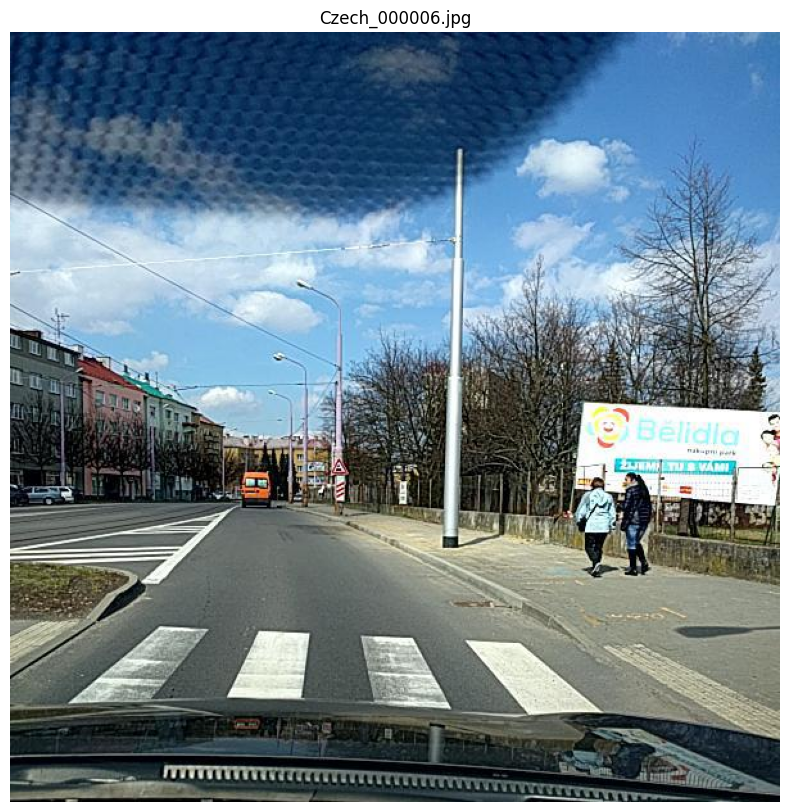

In [ ]:
img_dir = os.path.join(base_path, "crez/img")

# Get a list of image files in the directory
image_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

if image_files:
    # Select the first image file
    first_image_file = image_files[3]
    first_image_path = os.path.join(img_dir, first_image_file)

    # Load the image using OpenCV
    img = cv2.imread(first_image_path)

    # Convert from BGR to RGB as matplotlib expects RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10,10))
    plt.imshow(img_rgb)
    plt.title(first_image_file)
    plt.axis('off') # Hide axes for better image display
    plt.show()
else:
    print(f"No image files found in the directory: {img_dir}")

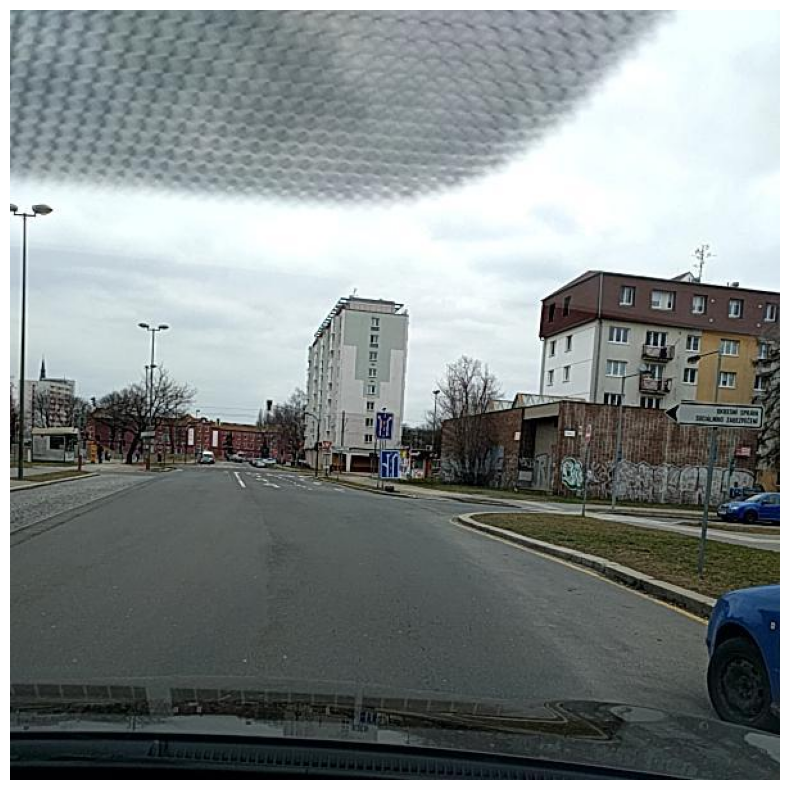

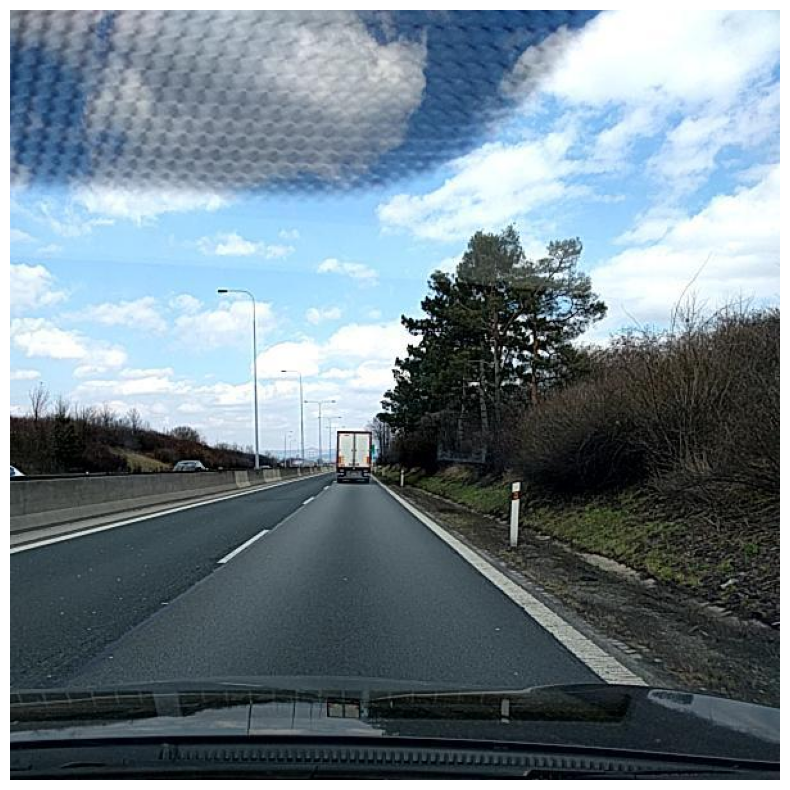

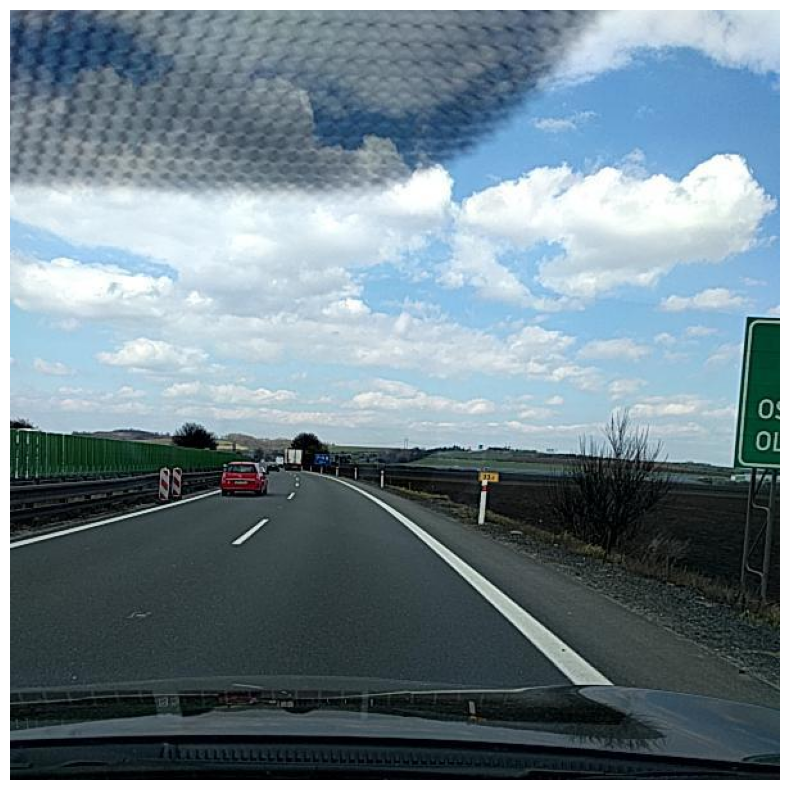

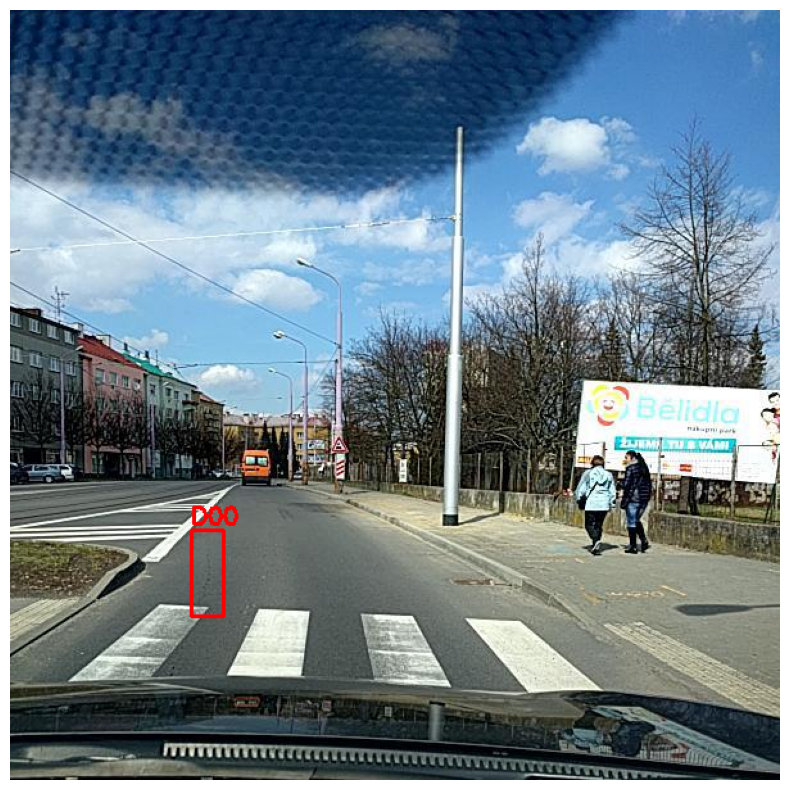

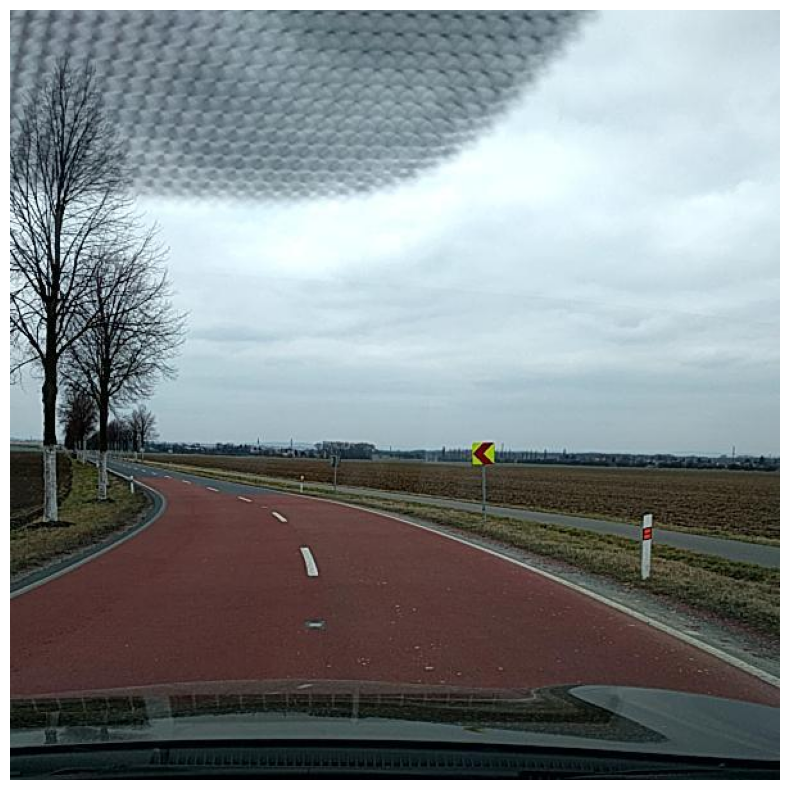

...

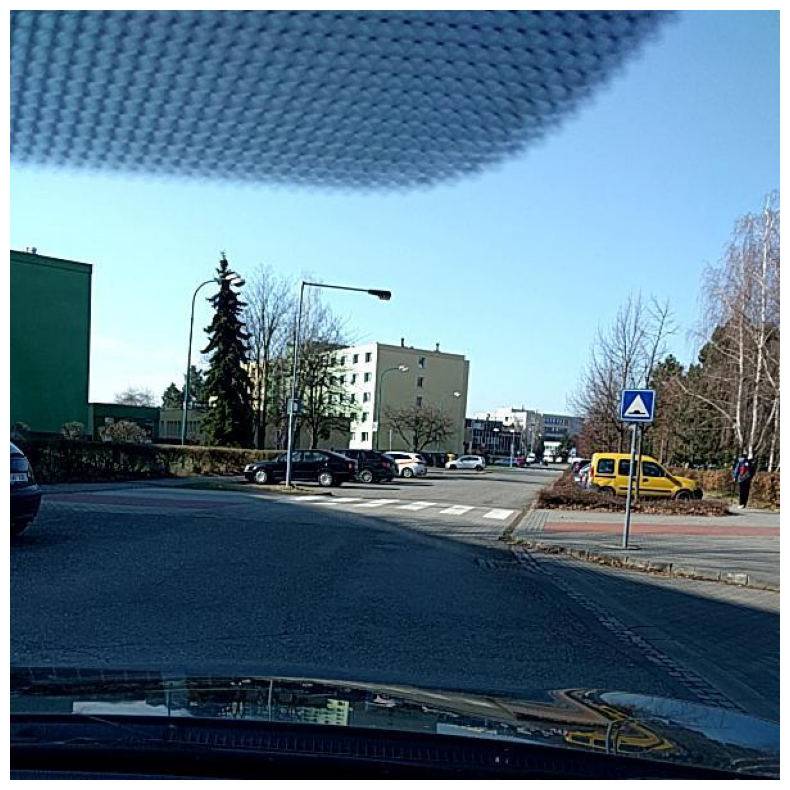

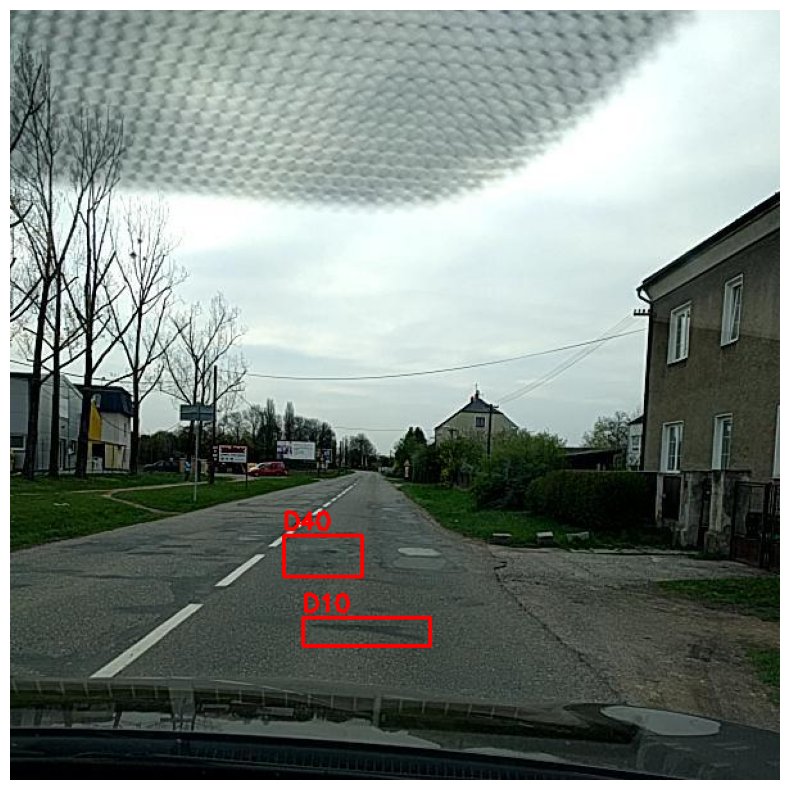

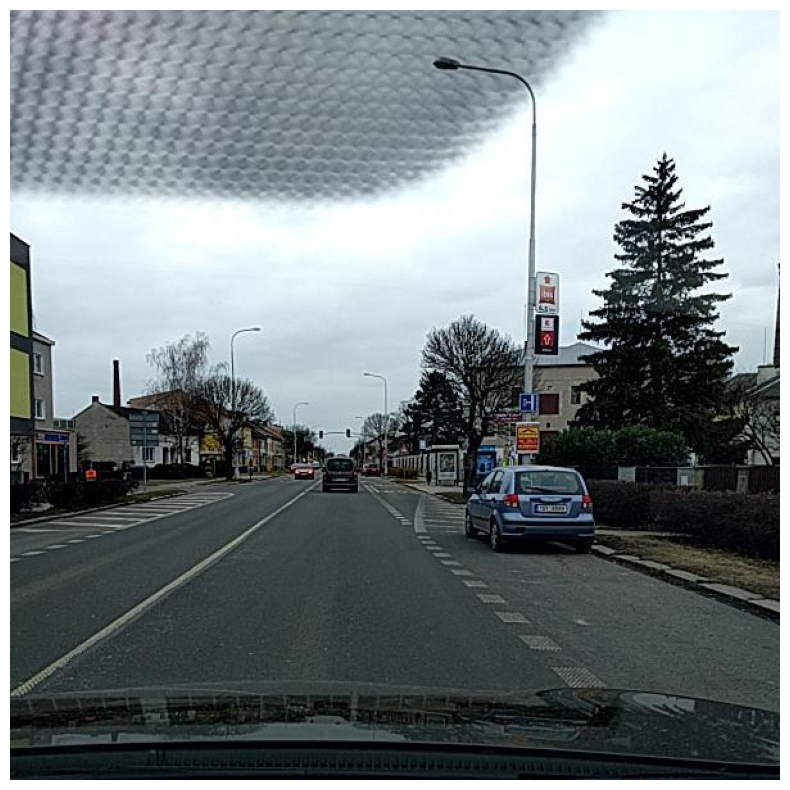

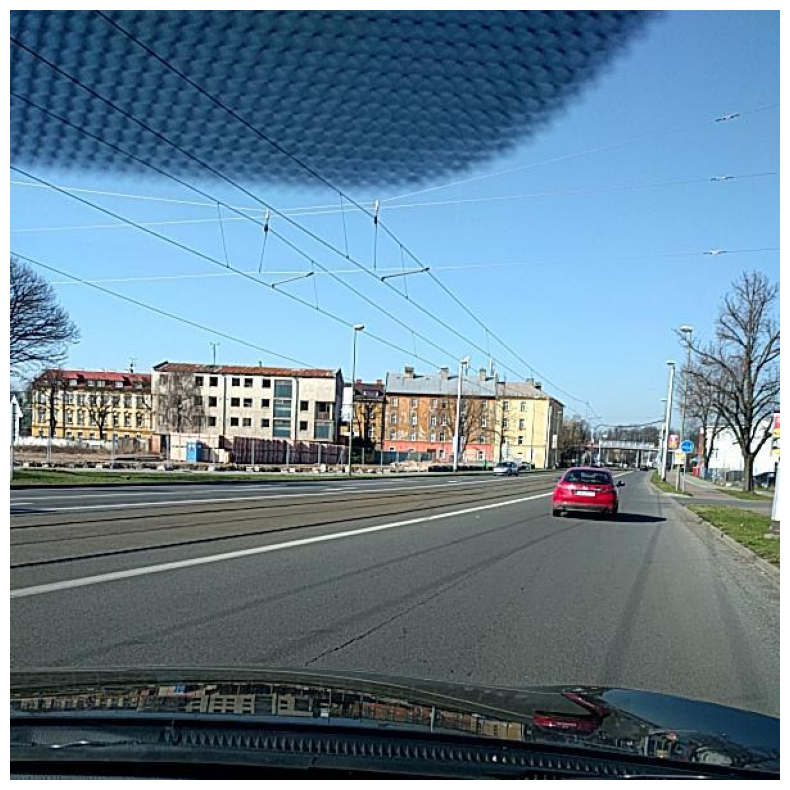

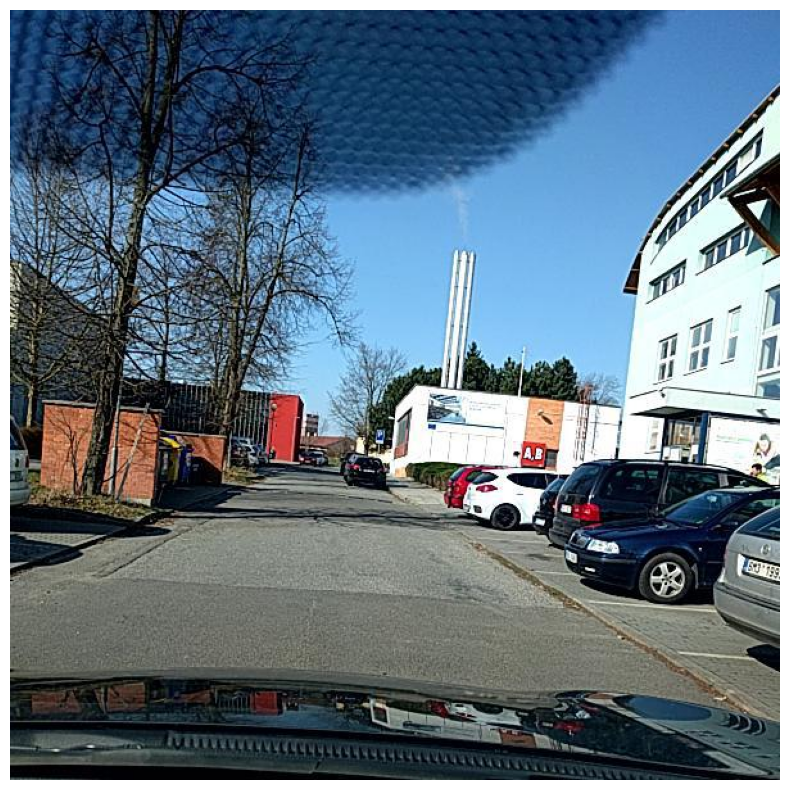

In [ ]:


base_path = "/content/drive/MyDrive/Path-hole-detection/sample_data_RDD"
img_dir = os.path.join(base_path, "crez/img")
anno_dir = os.path.join(base_path, "crez/anno")

def draw_annotations(image_path, annotation_path):
    # Load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Parse XML
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    # Loop through all objects in the annotation
    for obj in root.findall("object"):
        label = obj.find("name").text
        bbox = obj.find("bndbox")
        xmin = int(bbox.find("xmin").text)
        ymin = int(bbox.find("ymin").text)
        xmax = int(bbox.find("xmax").text)
        ymax = int(bbox.find("ymax").text)

        # Draw bounding box
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255,0,0), 2)
        cv2.putText(img, label, (xmin, ymin-5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (255,0,0), 2)

    return img

# Show a few samples
sample_images = os.listdir(img_dir)[:15]  # first 5 images
for i,img_file in enumerate(sample_images):
    image_path = os.path.join(img_dir, img_file)
    anno_path = os.path.join(anno_dir, os.path.splitext(img_file)[0] + ".xml")

    if os.path.exists(anno_path):
        annotated_img = draw_annotations(image_path, anno_path)
        plt.figure(figsize=(10,10))
        plt.imshow(annotated_img)
        plt.axis("off")
        plt.show()



In [ ]:
govs = ["Adachi", "Chiba", "Ichihara", "Muroran", "Nagakute", "Numazu", "Sumida"]

In [ ]:
cls_names = []
total_images = 0

# Assuming all annotation files are directly in the 'anno_dir' defined earlier
# If you intend to process a different structure, this logic will need further adjustment.



if not os.path.exists(anno_dir):
    print(f"Error: Annotation directory not found: {anno_dir}. Please check your path.")
else:
    file_list = [filename for filename in os.listdir(anno_dir) if filename.endswith('.xml') and not filename.startswith('.')]

    for file in file_list:
        total_images += 1
        xml_file_path = os.path.join(anno_dir, file)

        try:
            tree = ElementTree.parse(xml_file_path)
            root = tree.getroot()
            for obj in root.iter('object'):
                cls_name = obj.find('name').text
                cls_names.append(cls_name)
        except ElementTree.ParseError as e:
            print(f"Warning: Could not parse XML file {xml_file_path}: {e}. Skipping.")

print("total")
print("# of images：" + str(total_images))
print("# of labels：" + str(len(cls_names)))

total
# of images：14
# of labels：3


In [ ]:
damageTypes=["D00", "D01", "D10", "D11", "D20", "D40", "D43", "D44"]


D00 : 1
D01 : 0
D10 : 1
D11 : 0
D20 : 0
D40 : 1
D43 : 0
D44 : 0


<Axes: >

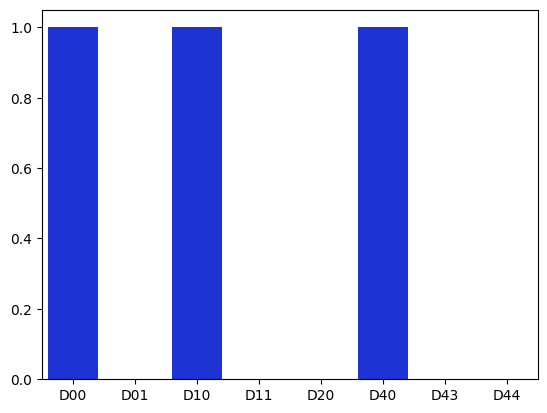

In [ ]:
count_dict = collections.Counter(cls_names)
cls_count = []
for damageType in damageTypes:
    print(str(damageType) + ' : ' + str(count_dict[damageType]))
    cls_count.append(count_dict[damageType])

sns.set_palette("winter", 8)
sns.barplot(x=damageTypes, y=cls_count)

In [ ]:
def binder(base_path, country):
    if not os.path.exists(os.path.join(base_path, country, 'images')) or not os.path.exists(os.path.join(base_path, country, 'annotations')):
        return [], []

    all_images = []
    all_annotations = []

    for each_image in sorted(os.listdir(os.path.join(base_path, country, 'images'))):
        new_image_path = os.path.join(base_path, country, 'images', each_image)
        all_images.append(new_image_path)

    for each_xml in sorted(os.listdir(os.path.join(base_path, country, 'annotations', 'xmls'))):
        new_xml_path = os.path.join(base_path, country, 'annotations', 'xmls', each_xml)
        all_annotations.append(new_xml_path)

    return all_images, all_annotations

In [ ]:

TRAIN_ROOT = "/content/drive/MyDrive/Path-hole-detection/sample_data_RDD"
OUTPUT_ROOT = "dataset"
SPLIT = "train"  # use "val" later for testing

CLASSES = ["D00", "D10", "D20", "D40"]

# Create output folders
os.makedirs(f"{OUTPUT_ROOT}/images/{SPLIT}", exist_ok=True)
os.makedirs(f"{OUTPUT_ROOT}/labels/{SPLIT}", exist_ok=True)

def convert_xml_to_yolo(xml_path, img_path, txt_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    img = Image.open(img_path)
    img_w, img_h = img.size

    with open(txt_path, "w") as f:
        for obj in root.findall("object"):
            cls = obj.find("name").text
            if cls not in CLASSES:
                continue

            cls_id = CLASSES.index(cls)
            box = obj.find("bndbox")

            xmin = float(box.find("xmin").text)
            ymin = float(box.find("ymin").text)
            xmax = float(box.find("xmax").text)
            ymax = float(box.find("ymax").text)

            x_center = ((xmin + xmax) / 2) / img_w
            y_center = ((ymin + ymax) / 2) / img_h
            w = (xmax - xmin) / img_w
            h = (ymax - ymin) / img_h

            f.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")

# ===== LOOP THROUGH COUNTRIES =====
for country in os.listdir(TRAIN_ROOT):
    country_path = os.path.join(TRAIN_ROOT, country)

    img_dir = os.path.join(country_path, "img")
    ann_dir = os.path.join(country_path, "anno")

    if not os.path.isdir(img_dir):
        continue

    for img_name in os.listdir(img_dir):
        if not img_name.endswith(".jpg"):
            continue

        base = img_name.replace(".jpg", "")
        img_path = os.path.join(img_dir, img_name)
        xml_path = os.path.join(ann_dir, base + ".xml")

        if not os.path.exists(xml_path):
            continue

        new_img_name = f"{country}_{img_name}"
        new_lbl_name = f"{country}_{base}.txt"

        shutil.copy(img_path, f"{OUTPUT_ROOT}/images/{SPLIT}/{new_img_name}")
        convert_xml_to_yolo(
            xml_path,
            img_path,
            f"{OUTPUT_ROOT}/labels/{SPLIT}/{new_lbl_name}"
        )

print("✅ Training data converted successfully!")


✅ Training data converted successfully!


In [ ]:
VALIDATION_ROOT = "/content/drive/MyDrive/Path-hole-detection/val"
OUTPUT_ROOT = "dataset"
SPLIT = "val"  # use "val" later for testing

CLASSES = ["D00", "D10", "D20", "D40"]

# Create output folders
os.makedirs(f"{OUTPUT_ROOT}/images/{SPLIT}", exist_ok=True)
os.makedirs(f"{OUTPUT_ROOT}/labels/{SPLIT}", exist_ok=True)

def convert_xml_to_yolo(xml_path, img_path, txt_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    img = Image.open(img_path)
    img_w, img_h = img.size

    with open(txt_path, "w") as f:
        for obj in root.findall("object"):
            cls = obj.find("name").text
            if cls not in CLASSES:
                continue

            cls_id = CLASSES.index(cls)
            box = obj.find("bndbox")

            xmin = float(box.find("xmin").text)
            ymin = float(box.find("ymin").text)
            xmax = float(box.find("xmax").text)
            ymax = float(box.find("ymax").text)

            x_center = ((xmin + xmax) / 2) / img_w
            y_center = ((ymin + ymax) / 2) / img_h
            w = (xmax - xmin) / img_w
            h = (ymax - ymin) / img_h

            f.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")

# ===== LOOP THROUGH COUNTRIES =====
for country in os.listdir(TRAIN_ROOT):
    country_path = os.path.join(TRAIN_ROOT, country)

    img_dir = os.path.join(country_path, "img")
    ann_dir = os.path.join(country_path, "anno")

    if not os.path.isdir(img_dir):
        continue

    for img_name in os.listdir(img_dir):
        if not img_name.endswith(".jpg"):
            continue

        base = img_name.replace(".jpg", "")
        img_path = os.path.join(img_dir, img_name)
        xml_path = os.path.join(ann_dir, base + ".xml")

        if not os.path.exists(xml_path):
            continue

        new_img_name = f"{country}_{img_name}"
        new_lbl_name = f"{country}_{base}.txt"

        shutil.copy(img_path, f"{OUTPUT_ROOT}/images/{SPLIT}/{new_img_name}")
        convert_xml_to_yolo(
            xml_path,
            img_path,
            f"{OUTPUT_ROOT}/labels/{SPLIT}/{new_lbl_name}"
        )

print("✅ Training data converted successfully!")

✅ Training data converted successfully!


In [ ]:
data_yaml = f"""
train: images/train
val: images/val

nc: 4
names:
  - D00
  - D10
  - D20
  - D40
"""
# os.makedirs(f"{OUTPUT_ROOT}/dataset/data.yaml", exist_ok=True)

with open(os.path.join("/content/dataset", 'data.yaml'), 'w') as f:
    f.write(data_yaml)

In [ ]:
model = YOLO('yolov10l.pt')

In [ ]:
OUTPUT_DIR="/content/dataset"
model.train(data=os.path.join(OUTPUT_DIR, 'data.yaml'),
            epochs=20,
            imgsz=640,
            batch=16,
            cache=True)

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12

In [ ]:
import shutil
from google.colab import files

# Specify the path to the folder you want to download
folder_to_download = '/content/dataset'

# Create a zip archive of the folder
archive_name = shutil.make_archive('dataset_archive', 'zip', folder_to_download)

# Download the zip file
files.download(archive_name)

print(f"Folder '{folder_to_download}' has been zipped to '{archive_name}' and downloaded.")

In [ ]:


folder_to_download = '/content/runs'

archive_name = shutil.make_archive('runs_archive', 'zip', folder_to_download)

files.download(archive_name)

print(f"Folder '{folder_to_download}' has been zipped to '{archive_name}' and downloaded.")